In [1]:
%matplotlib inline
from nltk.cluster.kmeans import KMeansClusterer
import nltk
import pickle

import torch
from pytorch_pretrained_bert import BertTokenizer, BertConfig, BertModel
from pytorch_pretrained_bert.modeling import BertPreTrainedModel, BertPreTrainingHeads
import numpy as np
from scipy.spatial.distance import cosine
import pickle
import re
import pandas as pd
device = 'cpu'
import sys
import os
import iso8601
from datetime import datetime

import json
import string

In [3]:
class BertForPreTraining_custom(BertPreTrainedModel):
    def __init__(self, config):
        super(BertForPreTraining_custom, self).__init__(config)
        self.bert = BertModel(config)
        self.cls = BertPreTrainingHeads(config, self.bert.embeddings.word_embeddings.weight)
        self.apply(self.init_bert_weights)

    def forward(self, input_ids, token_type_ids=None, attention_mask=None, masked_lm_labels=None, next_sentence_label=None):
        output_all_encoded_layers=True
        sequence_output, pooled_output = self.bert(input_ids, token_type_ids, attention_mask,
                                                   output_all_encoded_layers=output_all_encoded_layers)
        if output_all_encoded_layers:
            sequence_output_pred = sequence_output[-1]
        prediction_scores, seq_relationship_score = self.cls(sequence_output_pred, pooled_output)
        return prediction_scores, seq_relationship_score, sequence_output, pooled_output 
    
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
config = BertConfig.from_json_file('../models/bert_config.json')
bert_model = 'bert-base-uncased'

In [4]:
def getNSPScore(sample_text):
    
    m = torch.nn.Softmax()

    tokenized_text = tokenizer.tokenize(sample_text)
    indexed_tokens = tokenizer.convert_tokens_to_ids(tokenized_text)

    segments_ids = [0]*tokenized_text.index('[SEP]')+[1]*(len(tokenized_text)-tokenized_text.index('[SEP]'))

    tokens_tensor = torch.tensor([indexed_tokens])
    segments_tensors = torch.tensor([segments_ids])

    pred_score, seq_rel, seq_out, pool_out = model1(tokens_tensor, segments_tensors)
    return m(seq_rel).detach().numpy()[0][0] #returns probability of being next sentence

def getSentMatchScore(sent1, sent2, nsp_dampening_factor = 0.7):
    
    sent1_feats = getBERTFeatures(model1, sent1, attn_head_idx)
    sent2_feats = getBERTFeatures(model1, sent2, attn_head_idx)
    
    cosine_distance = 1- cosine(sent1_feats, sent2_feats)
    
    nsp_input1 = sent1+' [SEP] '+sent2
    nsp_input2 = sent2+' [SEP] '+sent1
    
    nsp_score_1 = getNSPScore(nsp_input1)
    nsp_score_2 = getNSPScore(nsp_input2)
    nsp_score = np.mean([nsp_score_1,nsp_score_2])*nsp_dampening_factor
    
    len_diff = abs(len(sent1.split(' '))-len(sent2.split(' ')))
    if len_diff>2*(min(len(sent1.split(' ')),len(sent2.split(' ')))):
        #give more weight to nsp if the sentences of largely varying lengths
        score = 0.4*cosine_distance+0.6*nsp_score
    else:
        score = np.mean([cosine_distance,nsp_score])
    
    #print ("nsp score -> " + str(nsp_score))
    #print ("cosine score -> " + str(cosine_distance))
    return score
    

def getSentMatchScore_wfeature(sent1, sent2, sent1_feats, sent2_feats, nsp_dampening_factor = 0.7):
    cosine_distance = 1-cosine(sent1_feats, sent2_feats)
    
    nsp_input1 = sent1+' [SEP] '+sent2
    #nsp_input2 = sent2+' [SEP] '+sent1
    
    nsp_score_1 = getNSPScore(nsp_input1)
    #nsp_score_2 = getNSPScore(nsp_input2)
    
    nsp_score = nsp_score_1 * nsp_dampening_factor
    #nsp_score = nsp_score_1*nsp_dampening_factor
    
    len_diff = abs(len(sent1.split(' '))-len(sent2.split(' ')))
    if len_diff>2*(min(len(sent1.split(' ')),len(sent2.split(' ')))):
        #give more weight to nsp if the sentences of largely varying lengths
        score = 0.4*cosine_distance+0.6*nsp_score
    else:
        score = np.mean([cosine_distance,nsp_score])
    
    return score

def getSentMatchScore_wfeature_cosine(sent1, sent2, sent1_feats, sent2_feats, nsp_dampening_factor = 0.7):
    cosine_distance = 1-cosine(sent1_feats, sent2_feats)
    
    return cosine_distance
    

def getBERTFeatures(model, text, attn_head_idx = -1): #attn_head_idx - index o[]
    tokenized_text = tokenizer.tokenize(text)
    if len(tokenized_text)>200:
        tokenized_text = tokenized_text[0:200]
    indexed_tokens = tokenizer.convert_tokens_to_ids(tokenized_text)
    tokens_tensor = torch.tensor([indexed_tokens])
    _, _, seq_out, pool_out = model(tokens_tensor)
    seq_out = list(getPooledFeatures(seq_out[attn_head_idx]).T)
    #pool_out = list(pool_out.detach().numpy().T)
    
    return seq_out

def getPooledFeatures(np_array):
    np_array = np_array.reshape(np_array.shape[1],np_array.shape[2]).detach().numpy()
    np_array_mp = np.mean(np_array, axis=0).reshape(1, -1)
    return np_array_mp

def replaceContractions(text):
    #text = text.lower()
    c_filt_text = ''
    for word in text.split(' '):
        if word in contractions:
            c_filt_text = c_filt_text+' '+contractions[word]
        else:
            c_filt_text = c_filt_text+' '+word
    return c_filt_text

def cleanText(text):
        
    #text = text.replace('\\n','')
    #text = text.replace('\\','')
    #text = text.replace('\t', '')
    #text = re.sub('\[(.*?)\]','',text) #removes [this one]
    text = re.sub('(http:\/\/www\.|https:\/\/www\.|http:\/\/|https:\/\/)?[a-z0-9]+([\-\.]{1}[a-z0-9]+)*\.[a-z]{2,5}(:[0-9]{1,5})?(\/.*)?\s',
                ' __url__ ',text) #remove urls
    text = re.sub('\'','',text)
    #text = re.sub(r'\d+', ' __number__ ', text) #replaces numbers
    #text = re.sub('\W', ' ', text)
    #text = re.sub(' +', ' ', text)
    #text = text.replace('\t', ' ')
    #text = text.replace('\n', ' ')
    return text

def formatTime(tz_time, datetime_object=False):
    isoTime = iso8601.parse_date(tz_time)
    ts = isoTime.timestamp()
    ts = datetime.utcfromtimestamp(ts).strftime("%Y-%m-%d %H:%M:%S:%f")

    if datetime_object:
        ts = datetime.fromisoformat(ts)
    return ts


In [5]:
model1 = BertForPreTraining_custom(config)
model1.to(device)
#state_dict_1 = torch.load('../data/bert_10epc_inc_se+etherdata_1e-6_sl40_bt64.bin')
state_dict_1 = torch.load('../models/bert_10epc_se_1e-6_sl40.bin')
model1.load_state_dict(state_dict_1)
model1.eval()

BertForPreTraining_custom(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): BertLayerNorm()
      (dropout): Dropout(p=0.1)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0): BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): BertLayerNorm()
              (dropout): Dropout(p=0.1)
            )
          )
          (intermediate): 

# parse csv medium dump data

In [21]:
## load it as csv.
import pandas

df = pandas.read_csv('../data/raw/se_medium_.csv', index_col=False, header=0);
#df = df.sort_values(by='created_at')
#texts = ' '.join(list(df['Data']))
#texts = ' '.join(list(df['Heading']))
texts = ""
for i in list(df['Heading']):
    texts= texts + '. '+ str(i)
#texts = '. '.join(list(map(lambda x: cleanText(x), list(df['Data']))))
#print (texts)

In [ ]:
import sys, pickle
sys.path.append('../../../')
import text_preprocessing.preprocess as tp
#df['Data'][0]
#tp.preprocess(texts[:5000], stop_words=False, remove_punct=False)
tp.preprocess(list(df['Data'])[1], stop_words=False, remove_punct=False, extra_filters=True)

In [ ]:
import re
re.sub("\W"," ",'As weve seen\u200a\u200anames are encoded as literal types.')

In [23]:
import sys, pickle
sys.path.append('../')
import text_preprocessing.preprocess as tp


mod_texts_unfiltered = tp.preprocess(texts, stop_words=False, remove_punct=False)
mod_texts = []

for index, sent in enumerate(mod_texts_unfiltered[:500]):
    if len(sent.split(' '))>250:
        length = len(sent.split(' '))
        split1 = ' '.join([i for i in sent.split(' ')[:round(length/2)]])
        split2 = ' '.join([i for i in sent.split(' ')[round(length/2):]])
        mod_texts.append(split1)
        mod_texts.append(split2)
        continue
        #mod_texts.pop(index)
    if len(sent.split(' '))<=6:
        continue
    mod_texts.append(sent)

print(len(mod_texts))
fv = {}

for index, sent in enumerate(mod_texts):
    fv[index] = getBERTFeatures(model1, sent, attn_head_idx=-1)
    #fv[index] = getBERTFeatures_KP(model1, sent, attn_head_idx=-3)
    print (index)

239
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238


In [24]:
import networkx as nx

def build_graph(doc_list):
    eng_graph = nx.Graph()
    try:
        eng_graph.add_nodes_from(range(len(doc_list)))
    except Exception as e:
        print(e)
    return eng_graph


tg = build_graph(mod_texts)

In [25]:
attn_head_idx = -1

node_edge = []

for index1, sent1 in enumerate(mod_texts):
    print (index1)
    for index2, sent2 in enumerate(mod_texts):
        if index1!=index2 and index2>index1:
            #score = getSentMatchScore_wfeature(sent1, sent2,fv[index1],fv[index2])
            score = getSentMatchScore_wfeature_cosine(sent1, sent2,fv[index1],fv[index2])
#             if score > 0.8:
#                 #tg.add_edge(index1,index2,{'weight': score})
#                 tg.add_edge(index1,index2)
            tg.add_edge(index1,index2,weight=score)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238


In [31]:
import math
import community
max_mod = 0
mod_v = 0
for v in [0.15, 0.10, 0.05]:
    flag = False
    for count in range(5):   
        temp_nodes = []
        for nodea,nodeb, weight in tg.edges.data():
            temp_nodes.append((nodea,nodeb,weight['weight']))
        temp_nodes = sorted(temp_nodes, key=lambda kv: kv[2], reverse=True)

        temp_nodes = temp_nodes[:math.ceil(len(temp_nodes)*v)+1]

        com_graph = nx.Graph()
        for nodea,nodeb, weight in temp_nodes:
            com_graph.add_edge(nodea,nodeb)

        partition = community.best_partition(com_graph)

        mod = community.modularity(partition, com_graph)
        if mod > max_mod:
            max_mod=mod
            mod_v = v
        print ("The pruning value 'v' and modularity is: ", v, mod)
#         if mod > 0.3:
#             flag=True
#             print ("Modularity reached 3. The pruning value 'v' is: ", v)
#             break
        if mod==0:
            temp_nodes = []
            print ("Modularity reached 0. The pruning value 'v' is: ", 0.15)
            for nodea,nodeb, weight in tg.edges.data():
                temp_nodes.append((nodea,nodeb,weight['weight']))
            temp_nodes = sorted(temp_nodes, key=lambda kv: kv[2], reverse=True)

            temp_nodes = temp_nodes[:math.ceil(len(temp_nodes)*0.15)+1]

            com_graph = nx.Graph()
            for nodea,nodeb, weight in temp_nodes:
                com_graph.add_edge(nodea,nodeb)

            partition = community.best_partition(com_graph)

            mod = community.modularity(partition, com_graph)
            flag=True
            break
    if flag:
        print()
        break

for count in range(5):
    temp_nodes = []
    for nodea,nodeb, weight in tg.edges.data():
        temp_nodes.append((nodea,nodeb,weight['weight']))
    temp_nodes = sorted(temp_nodes, key=lambda kv: kv[2], reverse=True)

    temp_nodes = temp_nodes[:math.ceil(len(temp_nodes)*mod_v)+1]

    com_graph = nx.Graph()
    for nodea,nodeb, weight in temp_nodes:
        com_graph.add_edge(nodea,nodeb)

    partition = community.best_partition(com_graph)
    mod = community.modularity(partition, com_graph)
    if mod>=mod_v:
        break

The pruning value 'v' and modularity is:  0.15 0.275004084360938
The pruning value 'v' and modularity is:  0.15 0.27427458126516807
The pruning value 'v' and modularity is:  0.15 0.2735323968874534
The pruning value 'v' and modularity is:  0.15 0.275004084360938
The pruning value 'v' and modularity is:  0.15 0.2730482848319132
The pruning value 'v' and modularity is:  0.1 0.3114275241255372
The pruning value 'v' and modularity is:  0.1 0.3094106632874534
The pruning value 'v' and modularity is:  0.1 0.3116349388052618
The pruning value 'v' and modularity is:  0.1 0.3033304501046703
The pruning value 'v' and modularity is:  0.1 0.30830840241806007
The pruning value 'v' and modularity is:  0.05 0.3688499124163615
The pruning value 'v' and modularity is:  0.05 0.37062353040967044
The pruning value 'v' and modularity is:  0.05 0.36007305540651435
The pruning value 'v' and modularity is:  0.05 0.36228631762088115
The pruning value 'v' and modularity is:  0.05 0.3708528456792072


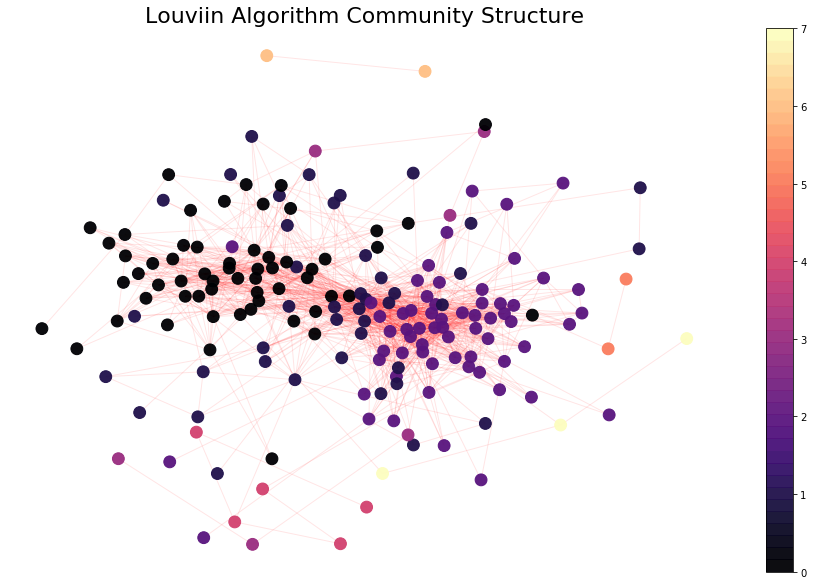

In [32]:
import community
import matplotlib.pyplot as plt
#partition = community.best_partition(com_graph)

values = [partition.get(node) for node in com_graph.nodes()]
values=[partition.get(node) for node in com_graph.nodes()]
plt.rcParams['figure.figsize']= [16, 10]
measure_name = "Louviin Algorithm Community Structure"
pos = nx.spring_layout(com_graph, k=0.2, iterations=20)
nodes_plot=nx.draw_networkx_nodes(com_graph, pos, node_size=140, label=True, cmap=plt.get_cmap('magma', len(com_graph.nodes())/4),node_color=values, alpha=0.95)
edges_plot=nx.draw_networkx_edges(com_graph, pos, edge_color='r', alpha=0.1)
plt.title(measure_name, fontsize=22, fontname='Arial')
plt.colorbar(nodes_plot)
plt.axis('off')
plt.show()

In [33]:
community.modularity(partition, com_graph)

0.36222270112675164

In [34]:
partition = sorted(partition.items(), key=lambda kv: kv[1], reverse=False)

In [35]:
current = 0
print ("--------------cluster " + str(0) + "------------ \n ")
for word, cluster in partition:
    if cluster!=current:
        print ("--------------cluster " + str(cluster) + "------------ \n ")
        print (mod_texts[word])
        current=cluster
    else:
        print (mod_texts[word] + "\n\n\n\n\n")
#     if current == 3:
#         break

--------------cluster 0------------ 
 
How I Made My Team More Efficient with Remote Desktop Manager.





Quick Python backend for your Slack bot on Apache OpenWhisk.





Increase your productivity with Continuous Delivery GitLab  Netlify.





Web Site Backup Best Practices You Should Probably Be Doing Auto Backups to the Cloud.





Full Cycle Developers at Netflix  Operate What You Build.





Improving Amazon Redshift Performance Our Data Warehouse Story.





Firebase  Google Cloud Whats different with Cloud Storage?.





A Do It Yourself ETL Framework in Python.





Why Android is Preferred Platform for On demand App Development.





Getting your manager to say yes to DevOps tools.





How To Get Started With GraphQL 📡 🔭.





Why TDD will change your developer life?.





How Can I Maximise my Software Teams Productivity?.





The Risk Management Paradox Enable Your Teams By Giving Up Control.





How to Test Developers Coding Skills Before Hiring.





Using Cloud Fires

# old approach (NA)

In [ ]:
import sys, pickle
sys.path.append('../')
import text_preprocessing.preprocess as tp

with open('../data/engg_text_06May19_recency.pkl','rb') as fp:
    file = pickle.load(fp)

texts = '. '.join(sent for sent in file)

mod_texts_unfiltered = tp.preprocess(texts, stop_words=False, remove_punct=True)
mod_texts = []

for index, sent in enumerate(mod_texts_unfiltered[:500]):
    if len(sent.split(' '))>250:
        length = len(sent.split(' '))
        split1 = ' '.join([i for i in sent.split(' ')[:round(length/2)]])
        split2 = ' '.join([i for i in sent.split(' ')[round(length/2):]])
        mod_texts.append(split1)
        mod_texts.append(split2)
        continue
        #mod_texts.pop(index)
    if len(sent.split(' '))<=6:
        continue
    mod_texts.append(sent)

print(len(mod_texts))
fv = {}

for index, sent in enumerate(mod_texts):
    fv[index] = getBERTFeatures(model1, sent, attn_head_idx=-1)
    print (index)

In [ ]:
import networkx as nx

def build_graph(doc_list):
    eng_graph = nx.Graph()
    try:
        eng_graph.add_nodes_from(range(len(doc_list)))
    except Exception as e:
        print(e)
    return eng_graph


tg = build_graph(mod_texts)

In [ ]:
for index1, sent1 in enumerate(mod_texts):
    for index2, sent2 in enumerate(mod_texts):
        if sent1!=sent2:
            score = getSentMatchScore_wfeature(sent1, sent2, fv[index1], fv[index2])
            print ("sentence 1 \n \n", sent1)
            print ("\n\nsentence 2 \n \n", sent2)
            print ("\n\n Score -> ", score, "\n\n\n\n\n")

In [ ]:
from tqdm import tqdm
import time
attn_head_idx = -1
start = time.time()
end = 0
node_edge = []
runs = len(mod_texts)*(len(mod_texts)-1)

sent1counter = 0
sent2counter = 0
counter = 0
try:
    i=0
    #tqdm()
    for index1, sent1 in enumerate(mod_texts):
        sent1counter=index1
        print (index1, time.time()-start)
        for index2, sent2 in enumerate(mod_texts):
            counter+=1
            #updt(runs, counter)
            sent2counter=index2
            if index1!=index2:
                score = getSentMatchScore_wfeature(sent1, sent2, fv[index1], fv[index2])
                if score>0.8:
                    #tg.add_edge(index1,index2,{'weight': score})
                    tg.add_edge(index1,index2)
except RuntimeError as e:
    print (e)
    print (sent1counter, sent2counter)
    

In [ ]:
scores_round = [round(i,1) for i in scores]
scores_freq = {}
for i in scores_round:
    scores_freq[i] = scores_round.count(i)
scores_round = set(scores_freq.keys())
scores_round

In [ ]:
sorted(scores_freq.items(), key=lambda kv: kv[0], reverse=True)

In [ ]:
sent1counter

In [ ]:
print (runs)

In [ ]:
tg.edges

In [ ]:
import community
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches

partition = community.best_partition(tg)

#drawing
# size = float(len(set(partition.values())))
# pos = nx.spring_layout(tg)
# count = 0.
# for com in set(partition.values()) :
#     count = count + 1.
#     list_nodes = [nodes for nodes in partition.keys()
#                                 if partition[nodes] == com]
#     nx.draw_networkx_nodes(tg, pos, list_nodes, node_size = 20,
#                                 node_color = str(count / size))

values = [partition.get(node) for node in tg.nodes()]
#nx.draw_networkx_edges(tg, pos, alpha=0.5)
#plt.show()
#plt.margins(0.1, 0.1)
#plt.figure(figsize=(10, 9))
#plt.axis('off')
#nx.draw_spring(tg, cmap = plt.get_cmap('jet'), node_color = values, node_size=300)
#draw_graph(tg, None)


values=[partition.get(node) for node in tg.nodes()]
plt.rcParams['figure.figsize']= [16, 10]
measure_name = "Louviin Algorithm Community Structure"
pos = nx.spring_layout(tg, k=0.2, iterations=20)
nodes_plot=nx.draw_networkx_nodes(tg, pos, node_size=140, label=True, cmap=plt.get_cmap('magma', len(tg.nodes())/4),node_color=values, alpha=0.95)
edges_plot=nx.draw_networkx_edges(tg, pos, edge_color='r', alpha=0.1)
plt.title(measure_name, fontsize=22, fontname='Arial')
plt.colorbar(nodes_plot)
plt.axis('off')
plt.show()

In [ ]:
partition = sorted(partition.items(), key=lambda kv: kv[1], reverse=False)


In [ ]:
partition

In [ ]:
current = 0
print ("--------------cluster " + str(0) + "------------ \n ")
for word, cluster in partition:
    if cluster!=current:
        print ("--------------cluster " + str(cluster) + "------------ \n ")
        print (mod_texts[word])
        current=cluster
    else:
        print (mod_texts[word])

In [ ]:

cluster0 = []
cluster_dict = {}
cluster1= []
cluster2 = []
cluster3 = []
cluster4= []
cluster5 = []
cluster6= []
cluster7 = []
for sent, cluster in partition:
    if cluster == 0:
        cluster0.append(sent)
        cluster_dict[sent] = 2
    elif cluster == 1:
        cluster1.append(sent)
    elif cluster == 2:
        cluster2.append(sent)
    elif cluster == 3:
        cluster3.append(sent)
    elif cluster == 4:
        cluster4.append(sent)
    elif cluster == 5:
        cluster5.append(sent)
    elif cluster == 6:
        cluster6.append(sent)
    elif cluster == 7:
        cluster7.append(sent)

In [ ]:
print ("------------Cluster 0--------------- \n\n")
for sent in cluster0:
    print (mod_texts[sent] + "\n\n")
    
print ("------------Cluster 1--------------- \n\n")
for sent in cluster1:
    print (mod_texts[sent] + "\n\n")
    
print ("------------Cluster 2--------------- \n\n")
for sent in cluster2:
    print (mod_texts[sent] + "\n\n")
print ("------------Cluster 3--------------- \n\n")
for sent in cluster3:
    print (mod_texts[sent] + "\n\n")
    
print ("------------Cluster 4--------------- \n\n")
for sent in cluster4:
    print (mod_texts[sent] + "\n\n")
    
print ("------------Cluster 5--------------- \n\n")
for sent in cluster5:
    print (mod_texts[sent] + "\n\n")
    
print ("------------Cluster 6--------------- \n\n")
for sent in cluster6:
    print (mod_texts[sent] + "\n\n")
    
print ("------------Cluster 7--------------- \n\n")
for sent in cluster7:
    print (mod_texts[sent] + "\n\n")

## POC on slack dump (json)

In [ ]:
import sys

sys.path.append('../')
from text_preprocessing import preprocess

from graphrank.graphrank import GraphRank

from graphrank.utils import GraphUtils
import networkx as nx
import json as js
import keyphrase_extraction as kp
import community
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches

In [ ]:
import json

def getslacktext(location):
    with open(location) as f:
        meeting = json.load(f)
    
#     text = []
    
#     for i in range(len(list(meeting['segments']))):
#         #unfil_text = meeting['segments'][i]['filteredText']
#         unfil_text = meeting['segments'][i]['originalText']
#         if len(unfil_text.split(' '))<6:
#             continue
#         if len(unfil_text.split(' '))>250:
#             length = len(unfil_text.split(' '))
#             split1 = ' '.join([i for i in unfil_text.split(' ')[:round(length/2)]])
#             split2 = ' '.join([i for i in unfil_text.split(' ')[round(length/2):]])
#             text.append(split1)
#             text.append(split2)
#             continue
#         text.append(unfil_text)
    
    return meeting

text = getslacktext('engineering_6thMay2019.json')
len(text)

In [ ]:
def getusermsg(text, userid = 'U9GLH098C'): #Venkat
    
    usermsg = []
    for index, msg in enumerate(text):
        if msg['type']=='message' and 'bot_id' not in msg.keys() and 'user' in msg.keys():
            if msg['user']==userid and msg['text']!='':
                    text = preprocess.preprocess(msg['text'], remove_punct=True,word_tokenize=False ,stop_words=False)
                    #print (text)
                    if len(text)!=0:
                        for t in text:
                            if len(t.split(' '))>6:
                                usermsg.append(t)
    return usermsg

def getusermsg_alluser(text): 
    
    usermsg = []
    user = {}
    cnt=0
    for index, msg in enumerate(text):
        if msg['type']=='message' and 'bot_id' not in msg.keys() and 'user' in msg.keys():
            if msg['text']!='':
                    text = preprocess.preprocess(msg['text'], remove_punct=True,word_tokenize=False ,stop_words=False)
                    #print (text)
                    if len(text)!=0:
                        for t in text:
#                             if len(t.split(' '))>6:
#                                 if msg['user'] in usermsg.keys() and len(usermsg[msg['user']])<10:
#                                     usermsg[msg['user']].append(t)
#                                 elif msg['user'] not in usermsg.keys():
#                                     usermsg[msg['user']] = []
#                                     usermsg[msg['user']].append(t)
                            if len(t.split(' '))>6:
                                usermsg.append(t) 
                                user[cnt] = msg['user']
                                cnt+=1
    return usermsg, user

#mod_texts = getusermsg(text,userid = 'U4QK2H8RL')[:20]
mod_texts, user_list = getusermsg_alluser(text)

In [ ]:
mod_texts = mod_texts[:100]

In [ ]:

print(len(mod_texts))
fv = {}

for index, sent in enumerate(mod_texts):
    fv[index] = getBERTFeatures(model1, sent, attn_head_idx=-1)
    print (index)

In [ ]:
import networkx as nx

def build_graph(doc_list):
    eng_graph = nx.Graph()
    try:
        eng_graph.add_nodes_from(range(len(doc_list)))
    except Exception as e:
        print(e)
    return eng_graph


tg = build_graph(mod_texts)

In [ ]:
from tqdm import tqdm
import time
attn_head_idx = -1
start = time.time()
end = 0
node_edge = []
runs = len(mod_texts)*(len(mod_texts)-1)

sent1counter = 0
sent2counter = 0
counter = 0
try:
    i=0
    #tqdm()
    for index1, sent1 in enumerate(mod_texts):
        sent1counter=index1
        print (index1, time.time()-start)
        for index2, sent2 in enumerate(mod_texts):
            
            #updt(runs, counter)
            sent2counter=index2
            if index1!=index2:
                score = getSentMatchScore_wfeature_test(sent1, sent2, fv[index1], fv[index2], user_list[index1], user_list[index1])
                if score>0:
                    counter+=1
                    tg.add_edge(index1,index2,weight=score)
                    #tg.add_edge(index1,index2)
except RuntimeError as e:
    print (e)
    print (sent1counter, sent2counter)
    

In [ ]:
sorted(nx.betweenness_centrality(tg).items(), key=lambda kv: kv[1], reverse=True)

In [ ]:
#tg.remove_node(1)

In [ ]:
mod_texts[19]

In [ ]:
print (len(mod_texts)*(len(mod_texts)-1))
(len(mod_texts)*(len(mod_texts)-1)) - counter

In [ ]:
import community
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches

partition = community.best_partition(tg)

#drawing
# size = float(len(set(partition.values())))
# pos = nx.spring_layout(tg)
# count = 0.
# for com in set(partition.values()) :
#     count = count + 1.
#     list_nodes = [nodes for nodes in partition.keys()
#                                 if partition[nodes] == com]
#     nx.draw_networkx_nodes(tg, pos, list_nodes, node_size = 20,
#                                 node_color = str(count / size))

values = [partition.get(node) for node in tg.nodes()]
#nx.draw_networkx_edges(tg, pos, alpha=0.5)
#plt.show()
#plt.margins(0.1, 0.1)
#plt.figure(figsize=(10, 9))
#plt.axis('off')
#nx.draw_spring(tg, cmap = plt.get_cmap('jet'), node_color = values, node_size=300)
#draw_graph(tg, None)


values=[partition.get(node) for node in tg.nodes()]
plt.rcParams['figure.figsize']= [16, 10]
measure_name = "Louviin Algorithm Community Structure"
pos = nx.spring_layout(tg, k=0.2, iterations=20)
nodes_plot=nx.draw_networkx_nodes(tg, pos, node_size=140, label=True, cmap=plt.get_cmap('magma', len(tg.nodes())/4),node_color=values, alpha=0.95)
edges_plot=nx.draw_networkx_edges(tg, pos, edge_color='r', alpha=0.1)
plt.title(measure_name, fontsize=22, fontname='Arial')
plt.colorbar(nodes_plot)
plt.axis('off')
plt.show()

In [ ]:
partition = sorted(partition.items(), key=lambda kv: kv[1], reverse=False)


In [ ]:
partition

In [ ]:

cluster0 = []
cluster_dict = {}
cluster1= []
cluster2 = []
cluster3 = []
cluster4= []
cluster5 = []
cluster6= []
cluster7 = []
for sent, cluster in partition:
    if cluster == 0:
        cluster0.append(sent)
        cluster_dict[sent] = 2
    elif cluster == 1:
        cluster1.append(sent)
    elif cluster == 2:
        cluster2.append(sent)
    elif cluster == 3:
        cluster3.append(sent)
    elif cluster == 4:
        cluster4.append(sent)
    elif cluster == 5:
        cluster5.append(sent)
    elif cluster == 6:
        cluster6.append(sent)
    elif cluster == 7:
        cluster7.append(sent)

In [ ]:
print ("------------Cluster 0--------------- \n\n")
for sent in cluster0:
    print (mod_texts[sent] + "\n\n")
    
print ("------------Cluster 1--------------- \n\n")
for sent in cluster1:
    print (mod_texts[sent] + "\n\n")
    
print ("------------Cluster 2--------------- \n\n")
for sent in cluster2:
    print (mod_texts[sent] + "\n\n")
print ("------------Cluster 3--------------- \n\n")
for sent in cluster3:
    print (mod_texts[sent] + "\n\n")
    
print ("------------Cluster 4--------------- \n\n")
for sent in cluster4:
    print (mod_texts[sent] + "\n\n")
    
print ("------------Cluster 5--------------- \n\n")
for sent in cluster5:
    print (mod_texts[sent] + "\n\n")
    
print ("------------Cluster 6--------------- \n\n")
for sent in cluster6:
    print (mod_texts[sent] + "\n\n")
    
print ("------------Cluster 7--------------- \n\n")
for sent in cluster7:
    print (mod_texts[sent] + "\n\n")

In [ ]:
cluster1_user = []
print ("------------Cluster 0--------------- \n\n")
for sent in cluster0:
    if user_list[sent] not in cluster1_user:
        print (user_list[sent] + "\n\n")
        cluster1_user.append(user_list[sent])
    else:
        continue

cluster2_user = []
print ("------------Cluster 1--------------- \n\n")
for sent in cluster1:
    if user_list[sent] not in cluster2_user:
        print (user_list[sent] + "\n\n")
        cluster2_user.append(user_list[sent])
    else:
        continue
        
print ("------ Cluster 0 - Cluster 1---------")
for i in cluster1_user:
    if i in cluster2_user:
        print (i)

In [ ]:
part ={}
for sent, cluster in partition:
    part[sent] = cluster

print (part[19],part[1],part[8],part[6],part[9])

In [ ]:
for i in [19,1,8]:
    print (mod_texts[i])

In [ ]:
for index1, sent1 in enumerate(mod_texts):
    for index2, sent2 in enumerate(mod_texts):
        if sent1!=sent2:
            score = getSentMatchScore_wfeature(sent1, sent2, fv[index1], fv[index2])
            print ("sentence 1 \n \n", sent1)
            print ("\n\nsentence 2 \n \n", sent2)
            print ("\n\n Score -> ", score, "\n\n\n\n\n")

In [ ]:
with open('/home/ether/domain_mind/engineering/se_minds_new.pkl', 'rb') as f:
    file = pickle.load(f)
file

In [ ]:
len(list(file['feature_vector'])[0])

In [ ]:
temp_score = []
sent_com = {}
max_index = 0
max_score = 0
for i in range(10):
    sent_com[i] = []

for index, sent in enumerate(mod_texts[:]):
    temp_score = []
    for index2, vec in enumerate(list(file['feature_vector'])):
        temp_score.append(getSentMatchScore_wfeature(sent, list(file['sentence'])[index2], fv[index], vec, model1))
#         print ("-------cluster-------")
#         print (sent)
#         print ("score -> " + str(temp_score[index2]))
    max_score = max(temp_score)
    max_index = temp_score.index(max_score)
    sent_com[max_index].append(sent)
    #print (max_index)
    #break
#for i in mod_texts[:10]:
        

In [ ]:
for cluster, sent in sent_com.items():
    print ("--------------community " + str(cluster) + "------------")
    for sentence in sent:
        print (sentence)

In [ ]:
list(file['sentence'])[9]

In [ ]:
text ="The only thing I can think of is that I had both the production and staging builds installed at that time vs now."
#text = "It is a very good time to re consider game of thrones story line"

## select 3 clusters instead of max-score while calculating belongingness of a sentences..


In [ ]:
sent_com = {}
max_index = 0
max_score = 0
for i in range(100):
    sent_com[i] = []

for index, sent in enumerate(mod_texts[:]):
    temp_score = {}
    for index2, vec in enumerate(list(file['feature_vector'])):
        temp_score[index2] = getSentMatchScore_wfeature(sent, list(file['sentence'])[index2], fv[index], vec)
#         print ("-------cluster-------")
#         print (sent)
#         print ("score -> " + str(temp_score[index2]))
    temp_score = dict(sorted(temp_score.items(), key = lambda fv : fv[1], reverse=True))
    max_indexes = [i for i in temp_score.keys()][:3]
    #max_index = temp_score.index(max_score)
    print (max_indexes)
#     for indexes in max_indexes:
#         sent_com[indexes].append(index)
    sent_com[index] = max_indexes
    #print (max_index)
    #break
#for i in mod_texts[:10]:
        

In [ ]:
for i in sent_com.keys():
    for j in sent_com.keys():
        if i!=j:
            if sorted(sent_com[i])==(sent_com[j]):
                print ("-------similar sentence--------")
                print (mod_texts[i])
                print ("\n")
                print (mod_texts[j])
            

## select 2 clusters instead of max-score while calculating belongingness of a sentences..


In [ ]:
sent_com = {}
max_index = 0
max_score = 0
for i in range(100):
    sent_com[i] = []

for index, sent in enumerate(mod_texts[:]):
    temp_score = {}
    for index2, vec in enumerate(list(file['feature_vector'])):
        temp_score[index2] = getSentMatchScore_wfeature(sent, list(file['sentence'])[index2], fv[index], vec)
#         print ("-------cluster-------")
#         print (sent)
#         print ("score -> " + str(temp_score[index2]))
    temp_score = dict(sorted(temp_score.items(), key = lambda fv : fv[1], reverse=True))
    max_indexes = [i for i in temp_score.keys()][:2]
    #max_index = temp_score.index(max_score)
    #print (max_indexes)
#     for indexes in max_indexes:
#         sent_com[indexes].append(index)
    sent_com[index] = max_indexes
    #print (max_index)
    #break
#for i in mod_texts[:10]:
        

In [ ]:
for i in sent_com.keys():
    for j in sent_com.keys():
        if i!=j:
            if sorted(sent_com[i])==(sent_com[j]):
                print ("-------similar sentence--------")
                print (mod_texts[i])
                print ("\n")
                print (mod_texts[j])
            

In [ ]:
paragraph = "I have a couple S3 buckets. One for my static home page, one for holding images and one for holding the application version. As far as I know, ELB automatically creates the one for managing the application versions."

paragraph = preprocess.preprocess(paragraph, stop_words=False, remove_punct=False)

In [ ]:
sent_vec = {}
for index, sentence in enumerate(paragraph):
    sent_vec[index] = getBERTFeatures(model1, sentence, attn_head_idx=-1)

In [ ]:
score = {}
for index, sent in enumerate(paragraph):
    temp_score = {}
    for index2, vec in enumerate(list(file['feature_vector'])):
        temp_score[index2] = getSentMatchScore_wfeature(sent, list(file['sentence'])[index2], sent_vec[index], vec)
    score[index] = max(temp_score.values())

In [ ]:
def get_norm_value(score):
    weighted_score = {}
    min_score = min(score.values())
    max_score = max(score.values())
    if min_score == max_score:
        return [1]*len(score.values())
    for index, s in enumerate(score.values()):
        weighted_score[index] = (s - min_score)/ (max_score - min_score)
    return weighted_score

def get_weighted_norm_value(score):
    weighted_score = {}
    tot_score = sum(score.values())
    for index, s in enumerate(score.values()):
        weighted_score[index] = s/tot_score
    return weighted_score

#weighted_score = list(get_weighted_norm_value(score).values())

In [ ]:
paragraph = []
paragraph_vec = np.zeros((768,), dtype=float)
for index, sent in enumerate(paragraph):
    sent_vec[index] = list(np.array(sent_vec[index])*weighted_score[index])
    
#paragraph_vec = np.sum(np.array(sent_vec.values()))

In [ ]:
for s in sent_vec.values():
    print (len(np.array(s)))
    paragraph_vec = np.add(paragraph_vec,np.array(s))
    break

In [ ]:
paragraph_vec = np.zeros((768,1), dtype=float)
paragraph3_vec = np.array(list(file['feature_vector'])[0])
(paragraph_vec + paragraph3_vec).shape

In [ ]:
np.array(list(file['feature_vector'])[0]).shape

In [ ]:
def get_paragraph_vec(paragraph, file):
    sent_vec = {}
    for index, sentence in enumerate(paragraph):
        sent_vec[index] = getBERTFeatures(model1, sentence, attn_head_idx=-2)
    score = {}
    for index, sent in enumerate(paragraph):
        temp_score = {}
        for index2, vec in enumerate(list(file['feature_vector'])):
            temp_score[index2] = getSentMatchScore_wfeature(sent, list(file['sentence'])[index2], sent_vec[index], vec)
        score[index] = max(temp_score.values())
        
    weighted_score = list(get_weighted_norm_value(score).values())
    
    paragraph = []
    paragraph_vec = np.zeros((768,1), dtype=float)
    for index, sent in enumerate(paragraph):
        sent_vec[index] = list(np.array(sent_vec[index])*weighted_score[index])
    

    for s in sent_vec.values():
        #print(np.add(paragraph_vec,np.array(s)).shape)
        paragraph_vec = np.add(paragraph_vec,np.array(s))
    
    print (paragraph_vec.shape)
    return paragraph_vec
    #paragraph_vec = np.sum(np.array(sent_vec.values()))

In [ ]:
paragraph = "I have a couple S3 buckets. One for my static home page, one for holding images and one for holding the application version. As far as I know, ELB automatically creates the one for managing the application versions."
paragraph2 = "Having a development environment and a production running at the same time is easy, but it’s expensive. It doubles it, in fact. Therefore, I usually destroy the dev environment as soon as I’m done with it."
paragraph4 = " I actually got a couple of S3 buckets. One for my the home page, one for images and one for the application version.  I know that, ELB will automatically create the one to managing the application versions. "
paragraph3 = "You find out that Harvard Business Review looked into how personality traits factor into group dynamics. While each person should have a functional role within the group, they also have a less obvious psychological role. You already know what functional roles you need to hire for — a product manager, two engineers, an analyst, and a designer. While a functional role is of course important, HBR found that the psychological role someone has to play is just as important to a team’s viability and productivity. Through their research, HBR came up with five different personality traits that are imperative to group success."
paragraph = preprocess.preprocess(paragraph, stop_words=False, remove_punct=False)
paragraph2 = preprocess.preprocess(paragraph2, stop_words=False, remove_punct=False)
paragraph3 = preprocess.preprocess(paragraph3, stop_words=False, remove_punct=False)
paragraph4 = preprocess.preprocess(paragraph4, stop_words=False, remove_punct=False)

In [ ]:
paragraph_fv = get_paragraph_vec(paragraph, file)
paragraph2_fv = get_paragraph_vec(paragraph2, file)
paragraph3_fv = get_paragraph_vec(paragraph3, file)
paragraph4_fv = get_paragraph_vec(paragraph4, file)

In [ ]:
from scipy.spatial.distance import cosine

#cosine(list(paragraph_fv), list(paragraph2_fv))
1-cosine(paragraph_fv, paragraph3_fv)

In [ ]:
paragraph2_fv.shape

# based on pre defined communities and tags

In [43]:
## load it as csv.
import pandas

df = pandas.read_csv('../data/raw/se_medium_.csv', index_col=False, header=0);
#df = df.sort_values(by='created_at')
#texts = ' '.join(list(df['Data']))
texts = '. '.join(list(map(lambda x: cleanText(x), list(df['Data']))))    
df

,Heading,URL,Tags,Data
0,"How to turn ugly Java APIs into elegant, type-...",https://medium.com/iterators/how-to-turn-ugly-...,"['Scala', 'Java', 'Api Design']",One of the reasons people use Scala is to have...
1,Software Architecture and Agile. Are they both...,https://medium.com/quick-code/software-archite...,"['Agile', 'Software Architecture']","In this article, we will discuss how Software ..."
2,Why Did We Shift Away From Database-Generated ...,https://medium.com/ingeniouslysimple/why-did-w...,"['Domain Driven Design', 'Cqrs', 'Distributed ...",In our current journey of building a Data Cata...
3,Dealing with the Developer Relations lifestyle,https://medium.com/@poshaughnessy/surviving-th...,"['Developer Relations', 'Burnout', 'Motivation...",Developer Relations can bring amazing opportun...
4,The Risk Management Paradox: Enable Your Teams...,https://medium.com/@ContinoHQ/the-risk-managem...,"['DevOps', 'Risk Management', 'Team Building',...","By Brett Luckabaugh, Account Principal, Contin..."
5,Building a real-time streaming dashboard with ...,https://medium.com/@xaviergeerinck/building-a-...,"['Spark', 'Big Data', 'IoT', 'Azure', 'Data Vi...",Check out the full code highlighted at: https:...
6,Quick and Easy JavaScript Benchmarking,https://medium.com/@daniellempesis/quick-and-d...,"['JavaScript', 'Benchmark', 'Code', 'Web Devel...",JSPerf is great. You can compare many differen...
7,Approach to Clean Architecture in Angular Appl...,https://medium.com/@thegiraffeclub/angular-cle...,"['Clean Architecture', 'Angular', 'Architectur...",If you are familiar with writing Angular appli...
8,Continuous Integration with .NET Core and Gitlab,https://medium.com/devopslinks/continuous-inte...,"['Git', 'Gitlab', 'Continuous Integration', 'D...","Starting off with CI/CD seems complicated, at ..."
9,What is an Organic (Microservice) Architecture?,https://medium.com/glasnostic/what-is-an-organ...,"['Microservices', 'Organic Architecture', 'Ser...",Because Glasnostic is an operations solution t...


In [44]:
article = {}
for index, para in enumerate(list(df['Data'])):
    article[index] = para
    

'One of the reasons people use Scala is to have access to vast amount of Java libraries.While it’s very beneficial to have a library for almost everything, these libraries are written in Java, which means you let in all the limitations of Java you have been escaping from\u200a—\u200agreatly restricted type-safety, lots of verbosity etc. Fortunately, it’s not very hard to mask these deficiencies with Scala wrapping that will ease the pain of consuming such an API.But sometimes these Java APIs utilize an object-is-just-like-a-hash-map technique which you can recognize by having lots of methods either operating on Map<String, Object> or, in the so-called fluent style, having signatures like withXxx(Object value), withYyy(String name, Object value) etc\xa0.This tendency destroys all the type-safety, maintainability, ability to refactor your code-base and can introduce a lot of subtle bugs, because you need to keep track in your head what instance is stored at which key, throughout all the 